# DBSCAN: Limitation

In this notebook we study the two limitations of DBSCAN that are related to the **quality of the clustering**.

- DBSCAN cannot cluster datasets well with **large differences in densities**.
- DBSCAN cannot cluster datasets well with **similar densities** when there is a significant overlap in the distributions.

### Tasks

We perform two tasks.

- Task 1: Cluster a 2D dataset containing two overlapping clusters of varying densities.
- Task 2: Cluster a 2D dataset containing two overlapping clusters of similar densities.

For comparison, we use Gaussian Mixture Model (GMM) and K-Means clustering algorithm.


Please note that irrespective of these limitations, DBSCAN is a powerful tool for both clustering and **anomaly detection**.

In [1]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

from sklearn.datasets import make_blobs

from sklearn.cluster import DBSCAN, KMeans
from sklearn.mixture import GaussianMixture

## Plotting Function

DBSCAN uses the following plotting function to display both the inliers and outliers.

We use cross marker (x) to denote the outliers.

In [2]:
def plot_dbscan(dbscan, X, size, show_xlabels=True, show_ylabels=True):
    core_mask = np.zeros_like(dbscan.labels_, dtype=bool)
    core_mask[dbscan.core_sample_indices_] = True
    anomalies_mask = dbscan.labels_ == -1
    non_core_mask = ~(core_mask | anomalies_mask)

    cores = dbscan.components_
    anomalies = X[anomalies_mask]
    non_cores = X[non_core_mask]
    
    plt.scatter(cores[:, 0], cores[:, 1],
                c=dbscan.labels_[core_mask], marker='o', s=size, cmap="Paired")
    plt.scatter(cores[:, 0], cores[:, 1], marker='*', s=20, c=dbscan.labels_[core_mask])
    plt.scatter(anomalies[:, 0], anomalies[:, 1],
                c="r", marker="x", s=100)
    plt.scatter(non_cores[:, 0], non_cores[:, 1], c=dbscan.labels_[non_core_mask], marker=".")
    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)
    plt.title("eps={:.2f}, min_samples={}".format(dbscan.eps, dbscan.min_samples), fontsize=14)

## DBSCAN

The DBSCAN algorithm requires us to specify the following two hyperparameters:

- eps 

        The maximum distance between two samples for one to be considered as in the neighborhood of the other. This is not a maximum bound on the distances of points within a cluster. 

- min_samples

        The number of samples (or total weight) in a neighborhood for a point to be considered as a core point. This includes the point itself.
        
        
### How do we set these two parameters?
        
Setting the values of these two parameters is very tricky. There is no automated way to do it. We need to decide based on the kind of data that we are using.

***eps***: 
- Very small value: There wouldn’t be enough points in a region to form a cluster. It would make **most of the points outliers**. 
- Very large value: The majority of the points would fall into one cluster. There would be **almost no outliers**. 

        Thus, we need to select the value wisely. More often or not, a smaller value is preferred for eps.


***min_samples***: 
- Very large value: It would need more points to form a cluster. Then, it would leave a **major chunk of points as outliers**. 
- Very small value: It would make clusters form even for what could have been an outlier.


The values of these two parameters depend on the kind of data and the expectation of the model.

## Task 1: Cluster a 2D Dataset Containing Two Overlapping Clusters of Varying Densities.


#### Create The Dataset

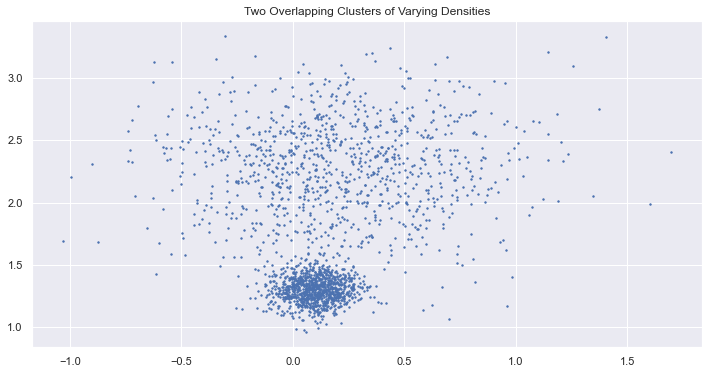

In [3]:
blob_centers = np.array(
    [[ 0.2,  2.3],
     [0.1,  1.3]])


blob_std = np.array([0.4, 0.1])

X1, y1 = make_blobs(n_samples=2000, centers=blob_centers,
                  cluster_std=blob_std, random_state=7)

plt.figure(figsize=(12, 6))
plt.title("Two Overlapping Clusters of Varying Densities")
plt.scatter(X1[:, 0], X1[:, 1], c=None, s=2, cmap='viridis');
plt.show()

## DBSCAN

We train the DBSCAN model using a range of "eps" and "min_samples" values.

Our goal is to see whether DBSCAN:
- Identifies two clusters (and outliers)
- Identifies the right shape of the two clusters 


For each pair of eps & min_samples we generate two clustering plots for better understanding.

We also show the number of clusters.

Cluster IDs:  [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29]


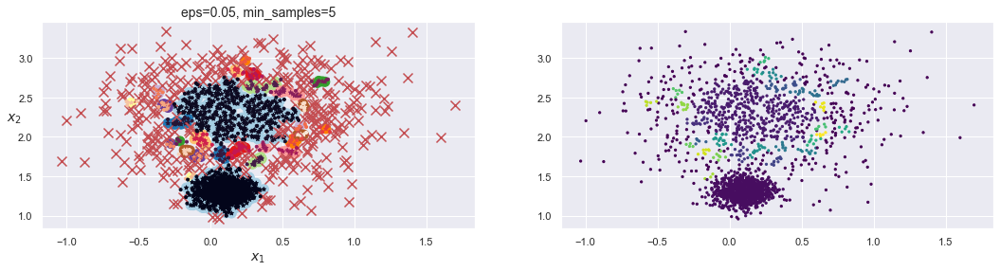

Cluster IDs:  [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13]


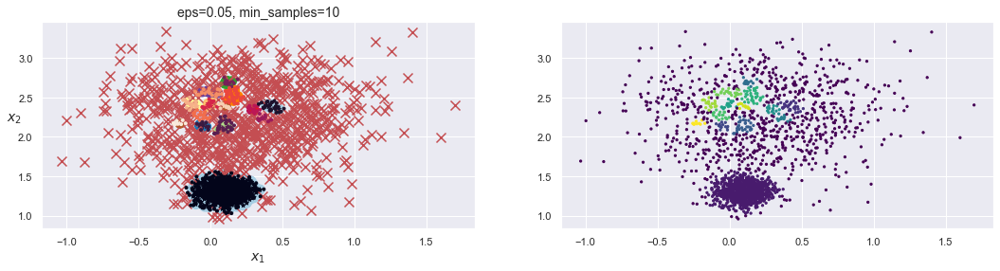

Cluster IDs:  [-1  0]


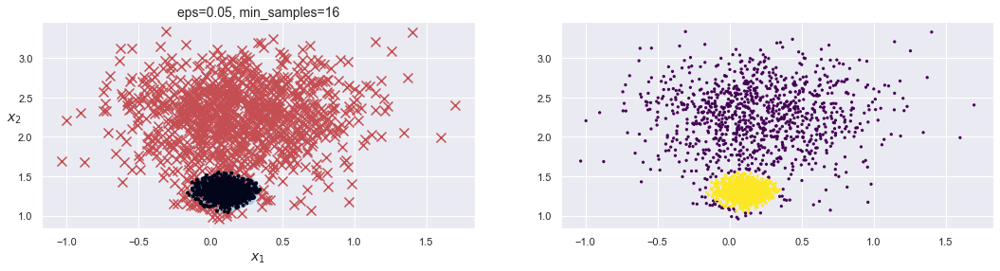

Cluster IDs:  [-1  0]


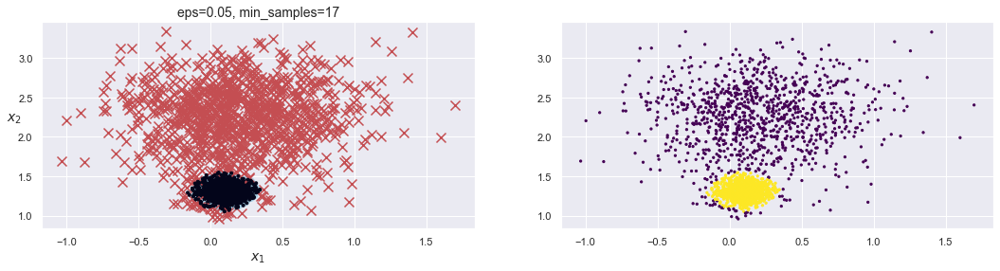

Cluster IDs:  [-1  0]


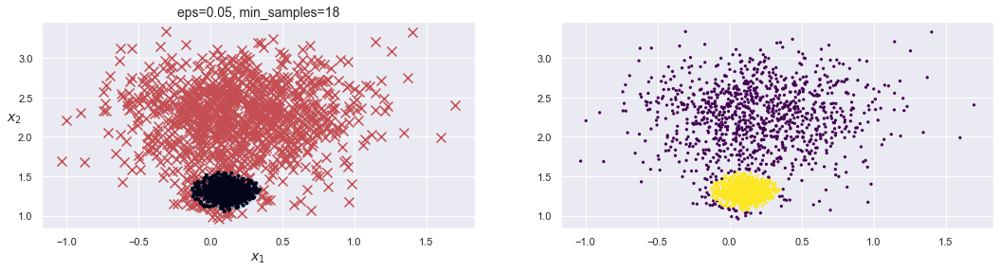

Cluster IDs:  [-1  0]


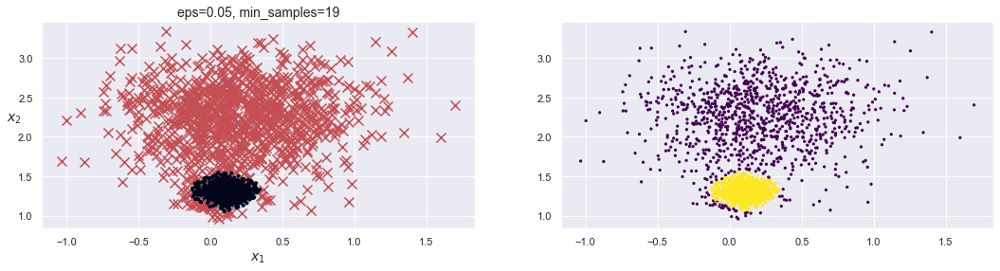

Cluster IDs:  [-1  0]


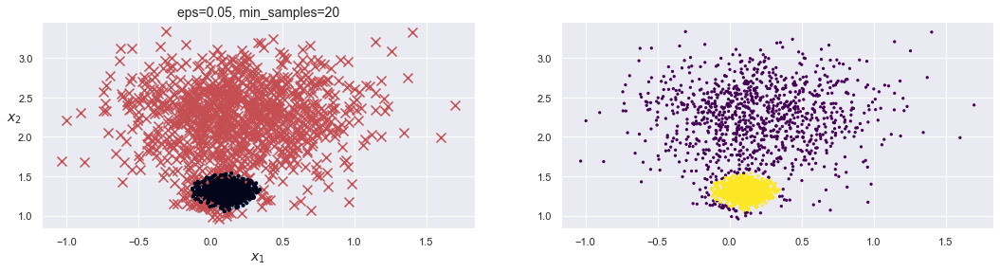

Cluster IDs:  [-1  0  1  2  3  4]


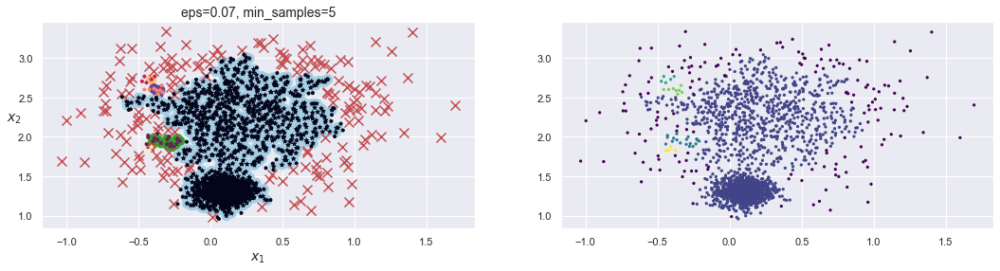

Cluster IDs:  [-1  0  1  2  3  4  5  6]


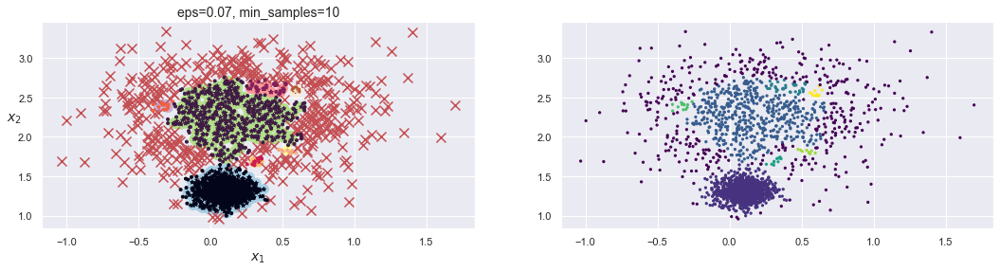

Cluster IDs:  [-1  0  1  2  3]


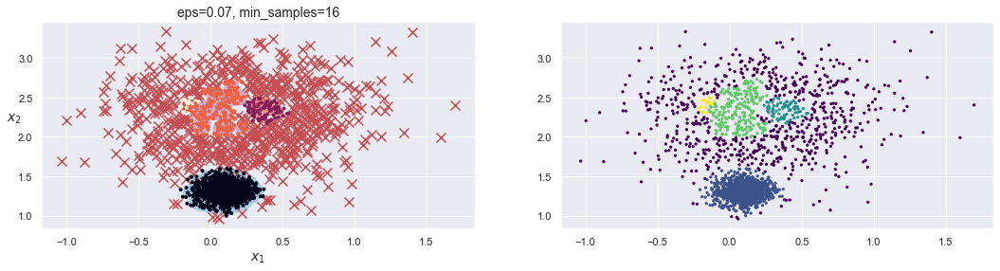

Cluster IDs:  [-1  0  1  2  3  4  5]


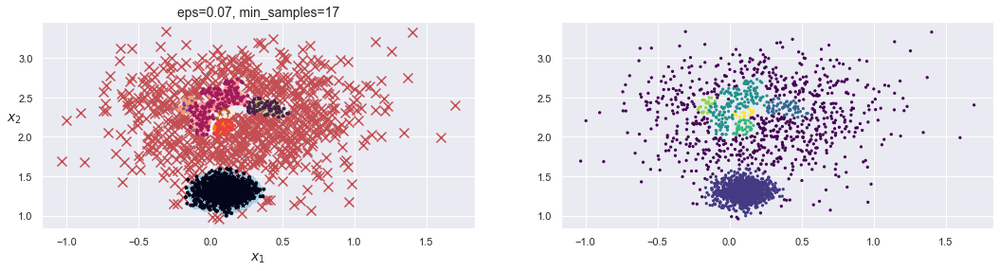

Cluster IDs:  [-1  0  1  2  3  4  5]


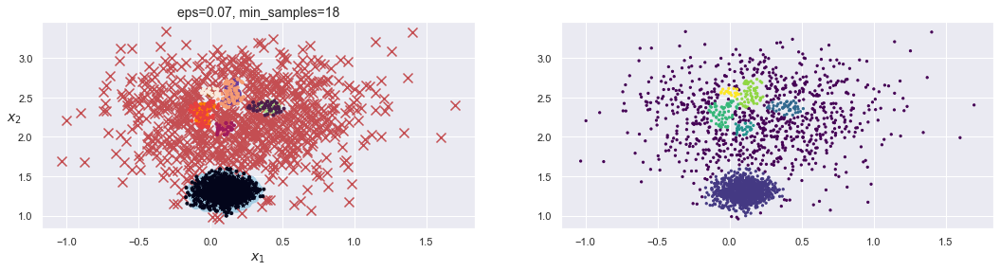

Cluster IDs:  [-1  0  1  2  3  4  5]


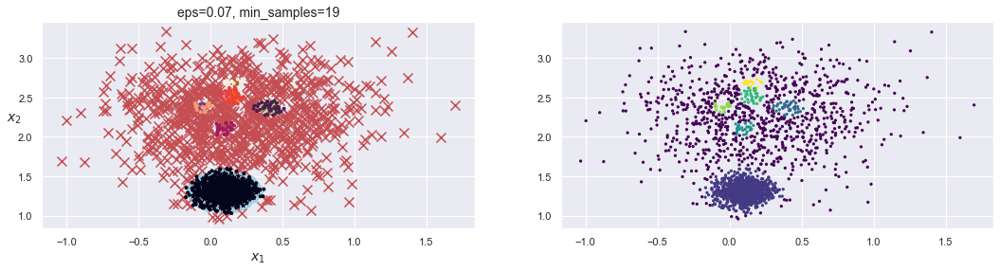

Cluster IDs:  [-1  0  1  2  3  4]


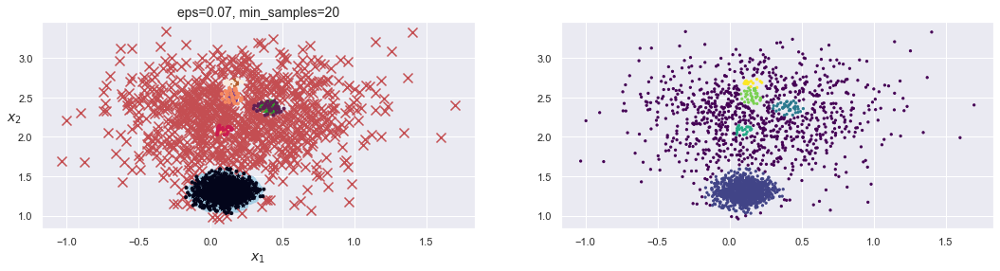

Cluster IDs:  [-1  0  1  2]


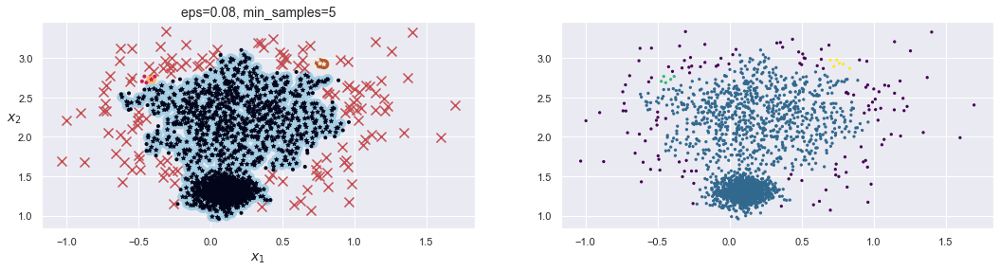

Cluster IDs:  [-1  0  1  2  3]


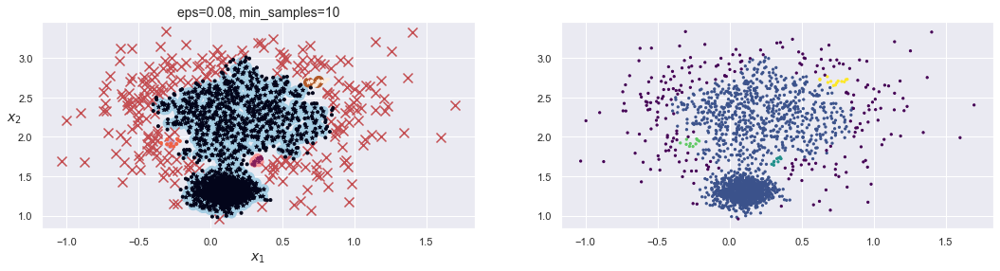

Cluster IDs:  [-1  0  1  2  3  4]


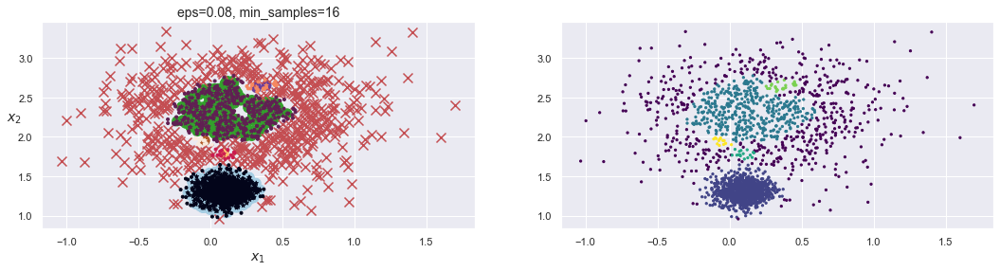

Cluster IDs:  [-1  0  1]


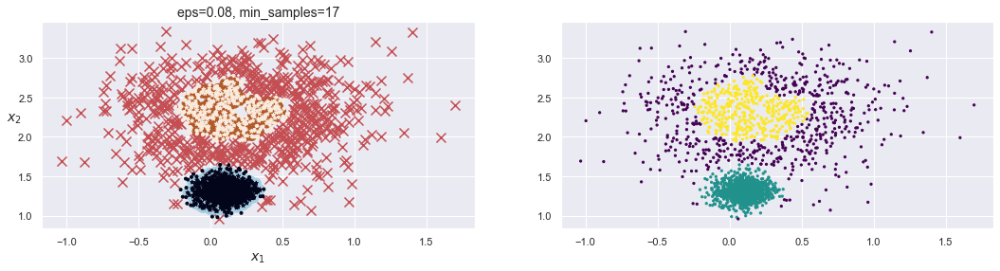

Cluster IDs:  [-1  0  1]


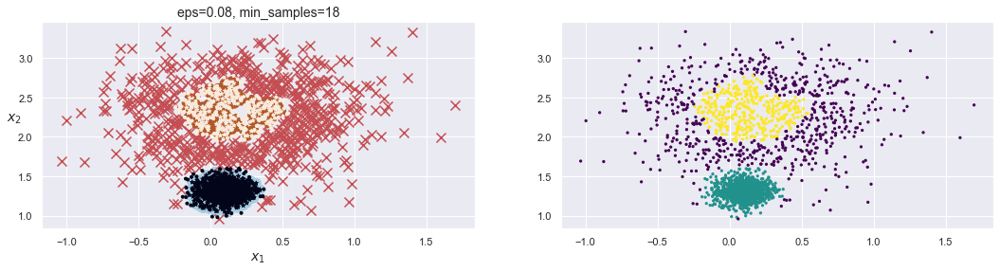

Cluster IDs:  [-1  0  1  2]


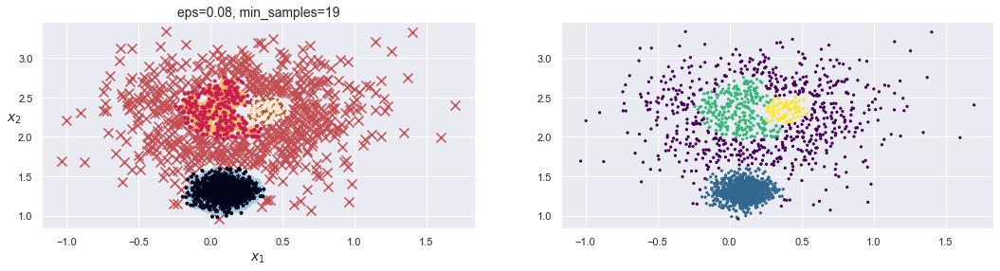

Cluster IDs:  [-1  0  1  2  3]


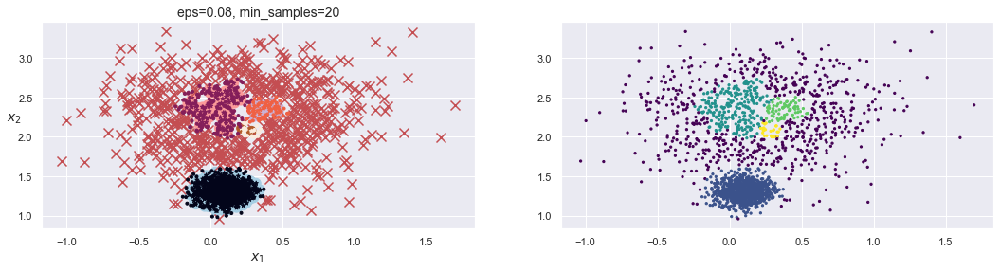

Cluster IDs:  [-1  0  1  2  3]


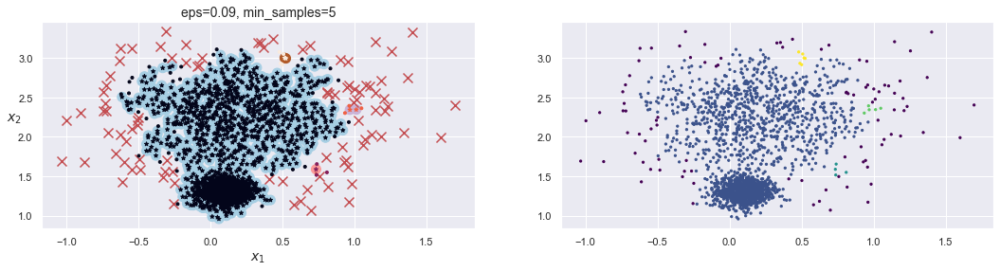

Cluster IDs:  [-1  0  1  2  3]


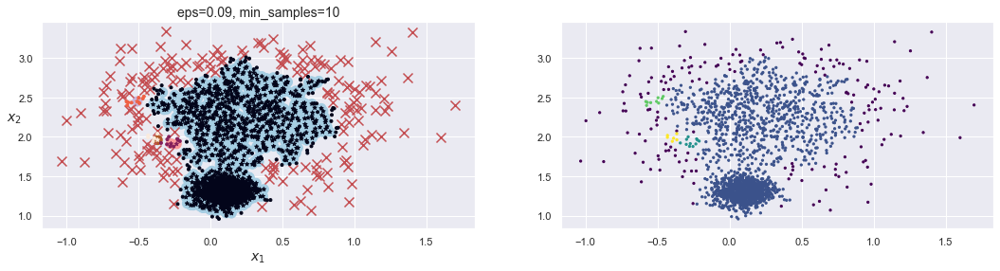

Cluster IDs:  [-1  0  1  2  3]


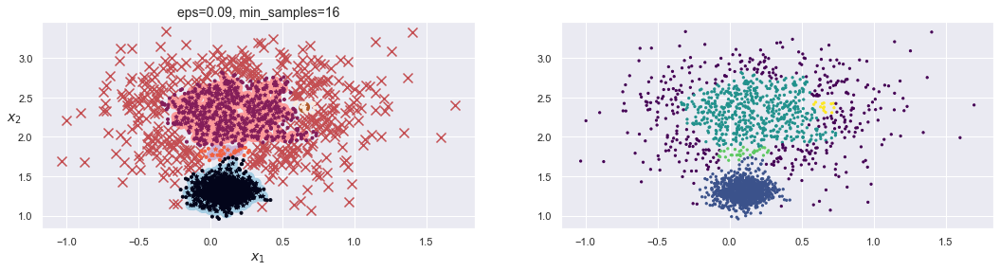

Cluster IDs:  [-1  0  1  2  3]


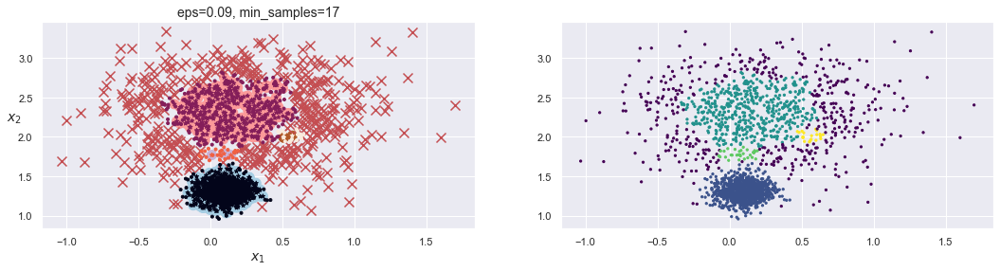

Cluster IDs:  [-1  0  1  2  3  4]


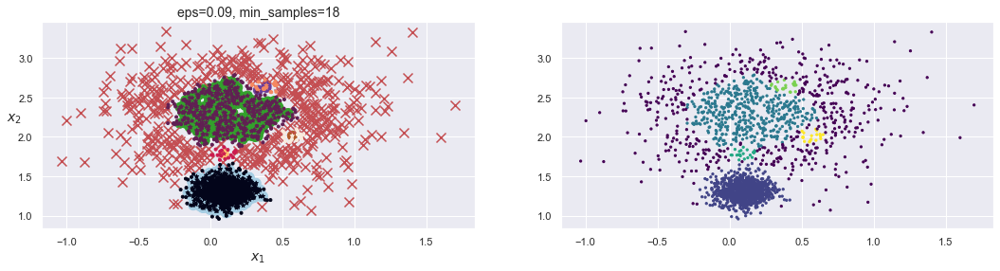

Cluster IDs:  [-1  0  1  2]


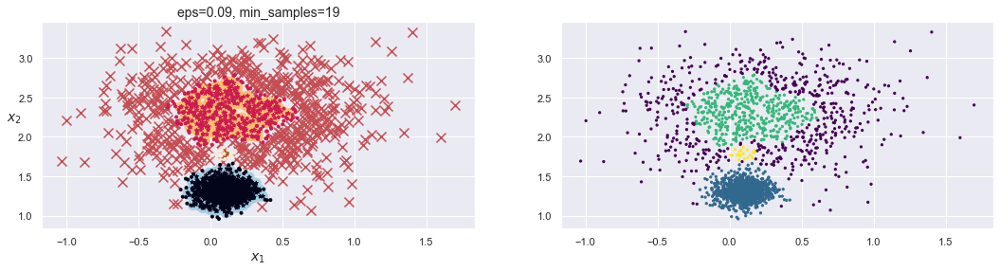

Cluster IDs:  [-1  0  1  2]


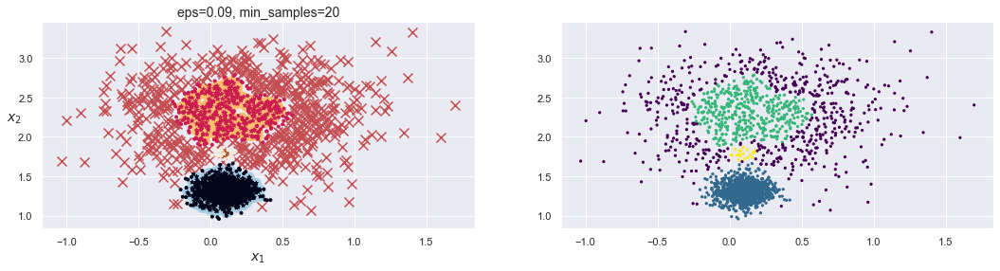

Cluster IDs:  [0]


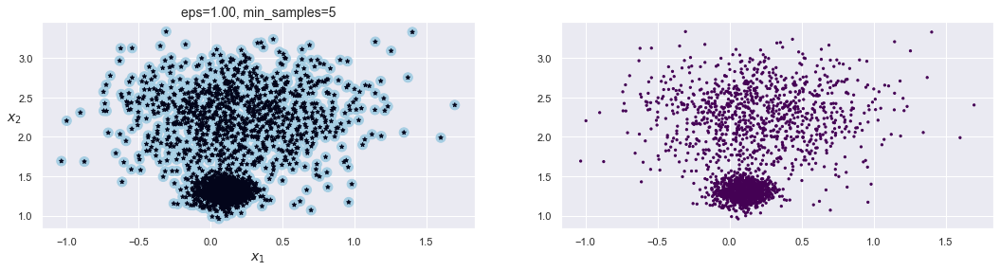

Cluster IDs:  [0]


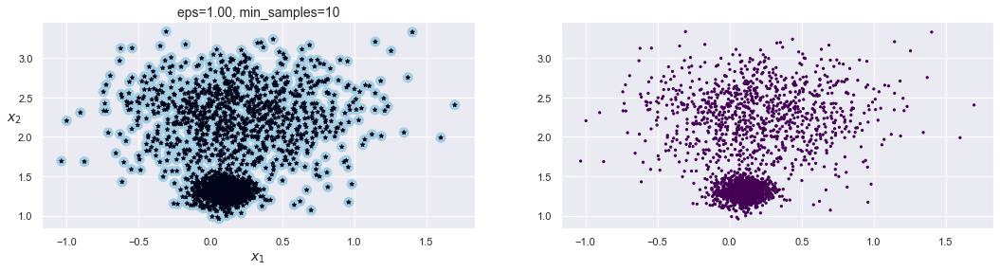

Cluster IDs:  [0]


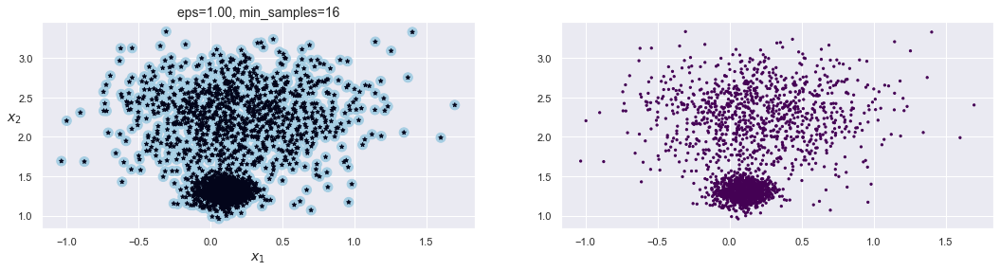

Cluster IDs:  [0]


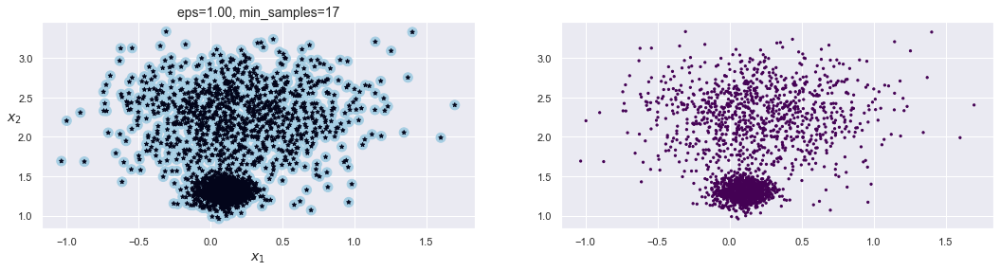

Cluster IDs:  [0]


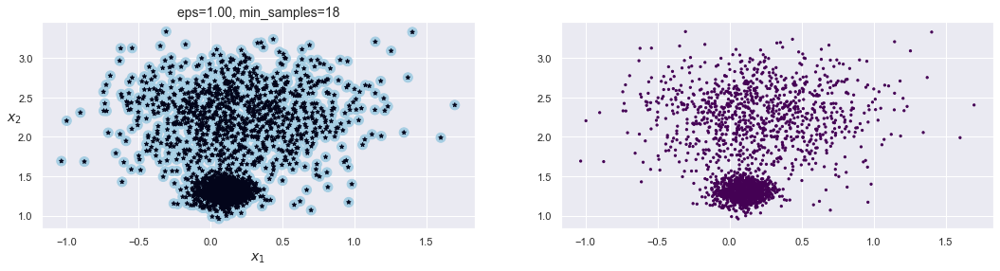

Cluster IDs:  [0]


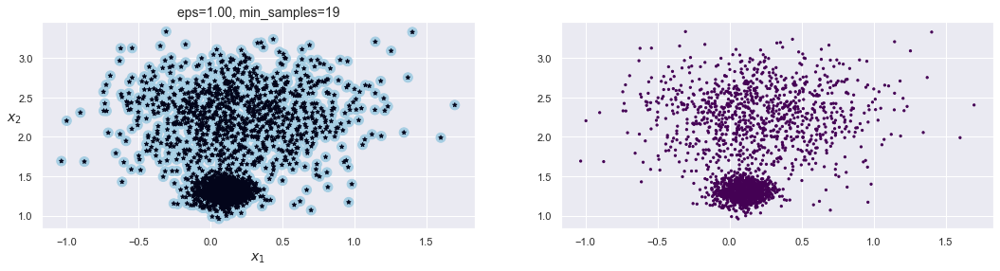

Cluster IDs:  [0]


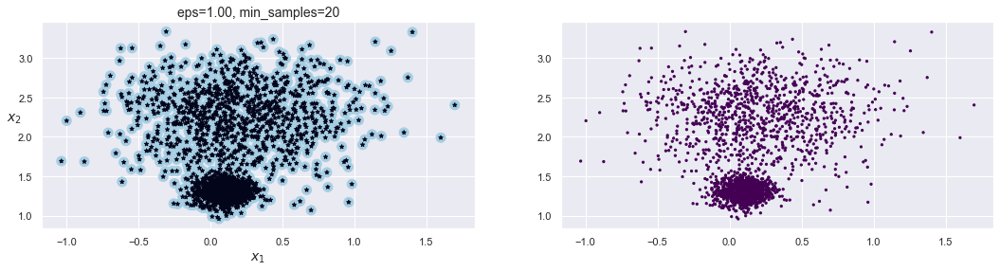

Cluster IDs:  [0]


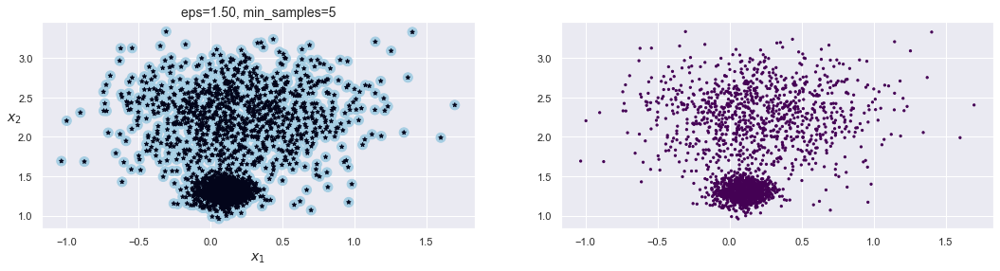

Cluster IDs:  [0]


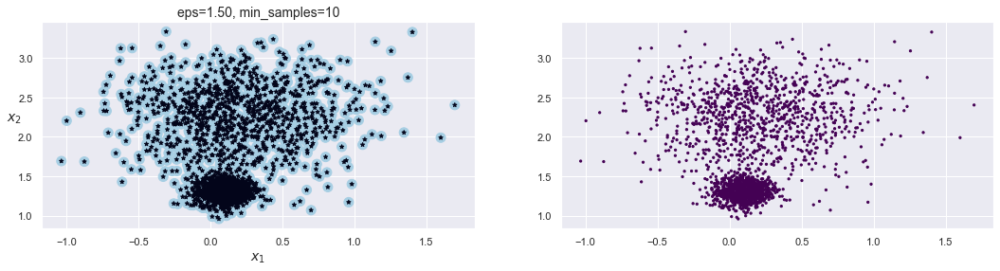

Cluster IDs:  [0]


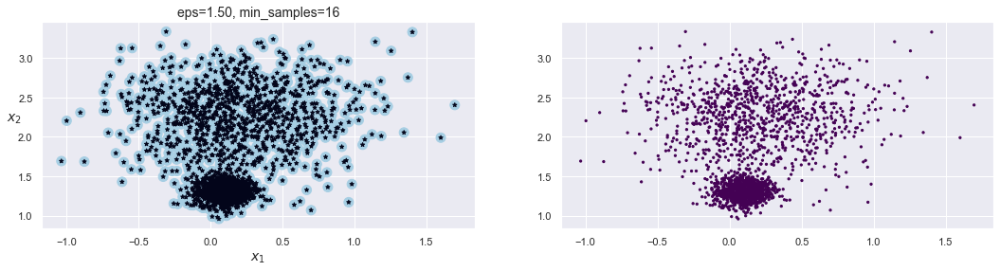

Cluster IDs:  [0]


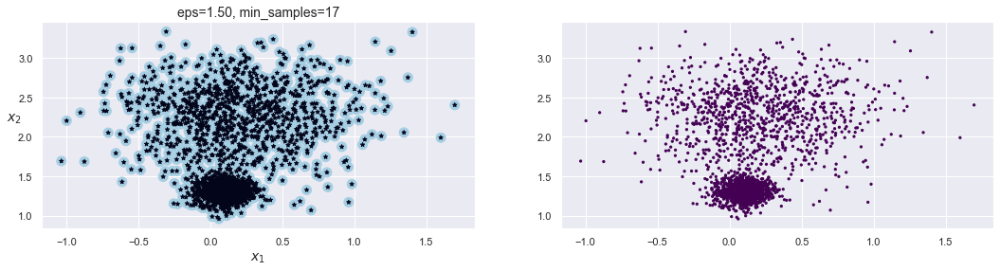

Cluster IDs:  [0]


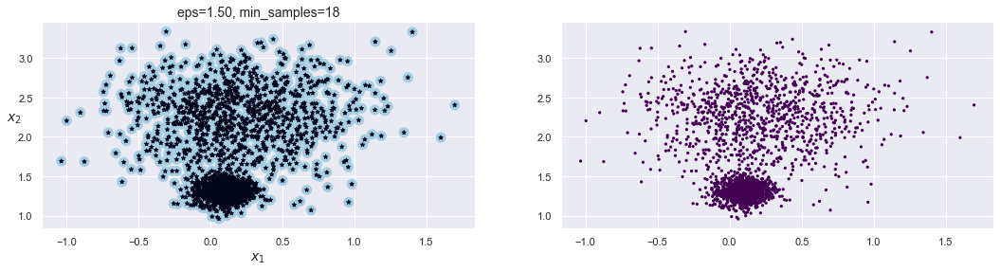

Cluster IDs:  [0]


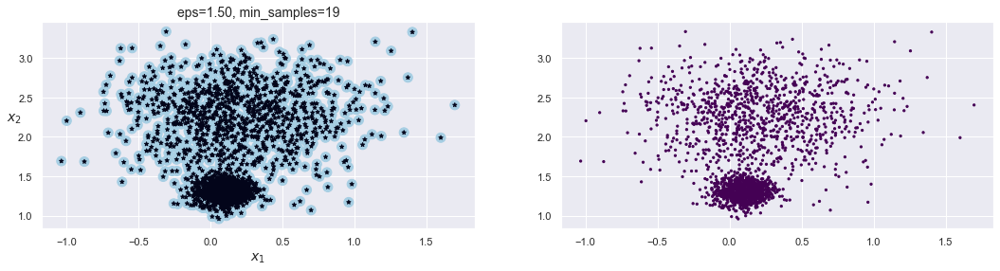

Cluster IDs:  [0]


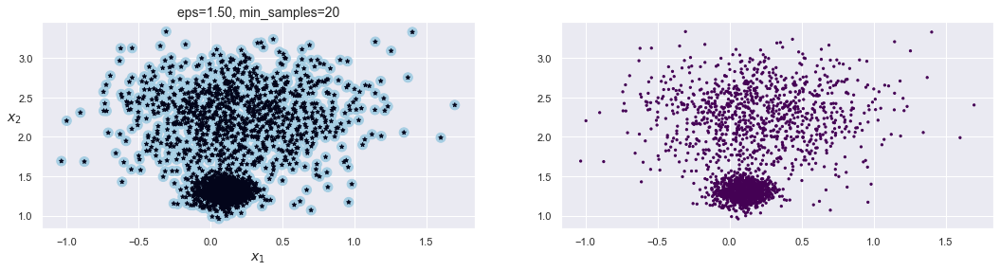

In [4]:
eps_list = [0.05, 0.07, 0.08, 0.09, 1.0, 1.5]
min_sample_list = [5, 10, 16, 17, 18, 19, 20]



for i in range(len(eps_list)):
    for j in range(len(min_sample_list)):
        dbscan1 = DBSCAN(eps=eps_list[i], min_samples=min_sample_list[j])
        dbscan1.fit(X1)

        print("Cluster IDs: ", np.unique(dbscan1.labels_))
        
        plt.figure(figsize=(18, 4))

        plt.subplot(121)
        plot_dbscan(dbscan1, X1, size=100)

        plt.subplot(122)
        plt.scatter(X1[:, 0], X1[:, 1], c=dbscan1.labels_, s=5, cmap='viridis');
        plt.show()


## Task 1: Observation

From the above experimentation we find the best pair of eps (=0.08) & min_samples (=17). The resultant clusters are shown below.

We see that although DBSCAN is able to discover two clusters, it **fails to identify the shape of the larger cluster** (that has large density).

This is because the min_samples-eps combination cannot be chosen appropriately for all clusters when the density among the clusters vary widely..

Cluster IDs:  [-1  0  1]


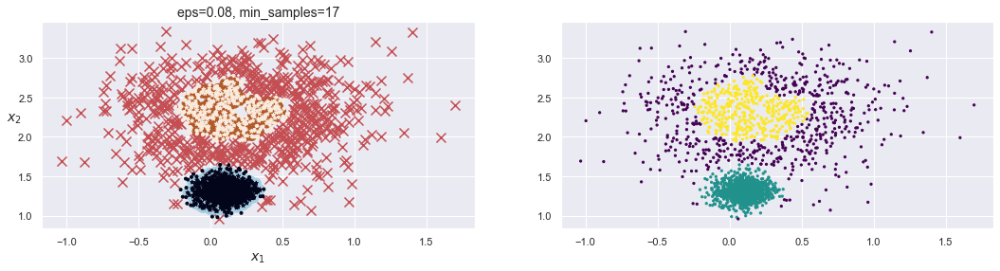

In [6]:
dbscan1 = DBSCAN(eps=0.08, min_samples=17)
dbscan1.fit(X1)

print("Cluster IDs: ", np.unique(dbscan1.labels_))

plt.figure(figsize=(18, 4))

plt.subplot(121)
plot_dbscan(dbscan1, X1, size=100)

plt.subplot(122)
plt.scatter(X1[:, 0], X1[:, 1], c=dbscan1.labels_, s=5, cmap='viridis');
plt.show()

## Task 1: Compare With GMM and K-Means

We see that (figure below) both GMM and K-Means are able to **discover the shape** of both the clusters.

However, GMM performs much better than K-Means.

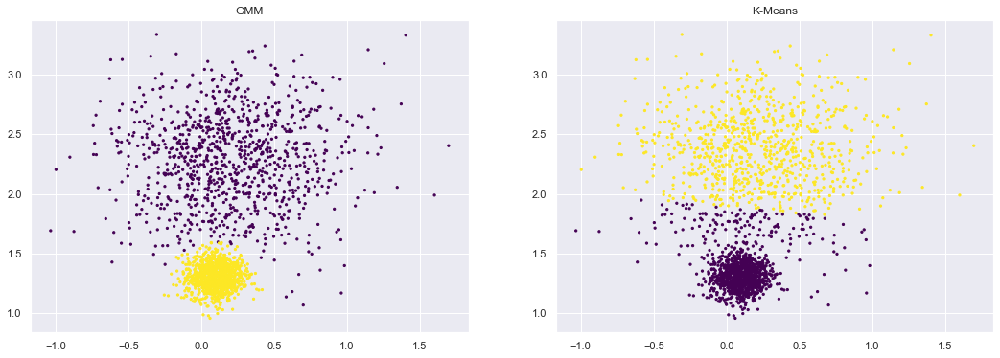

In [15]:
# Train the GMM
gmm1=GaussianMixture(n_components=2, n_init=10, random_state=42)
gmm1.fit(X1)


# Train the K-Means model
kmeans1=KMeans(n_clusters=2, init='k-means++', n_init=10, random_state=42, verbose=0)
kmeans1.fit(X1)


plt.figure(figsize=(18, 6))
plt.subplot(121)
plt.title("GMM")
plt.scatter(X1[:, 0], X1[:, 1], c=gmm1.predict(X1), s=5, cmap='viridis');


plt.subplot(122)
plt.title("K-Means")
plt.scatter(X1[:, 0], X1[:, 1], c=kmeans1.fit_predict(X1), s=5, cmap='viridis');

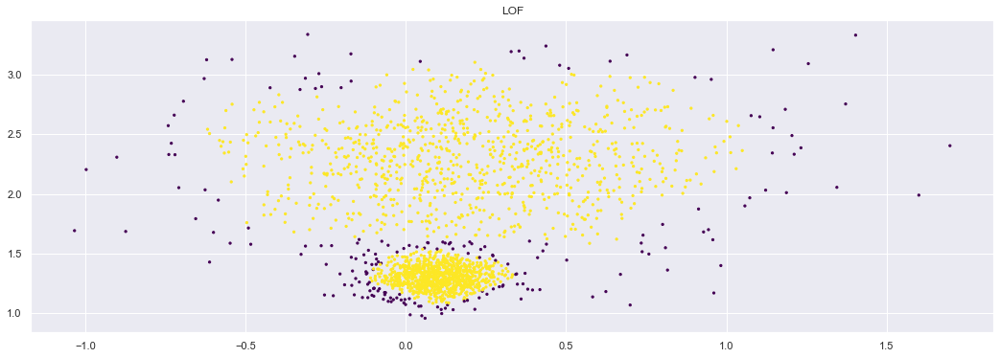

In [16]:
from sklearn.neighbors import LocalOutlierFactor

lof = LocalOutlierFactor(n_neighbors=40, algorithm='auto', leaf_size=10, 
                           metric='minkowski', p=2, metric_params=None, contamination=0.1, n_jobs=-1)

plt.figure(figsize=(18, 6))

plt.title("LOF")
plt.scatter(X1[:, 0], X1[:, 1], c=lof.fit_predict(X1), s=5, cmap='viridis')
plt.show()

## Task 2: Cluster a 2D dataset Containing Two Overlapping Clusters of Similar Densities.


#### Create The Dataset

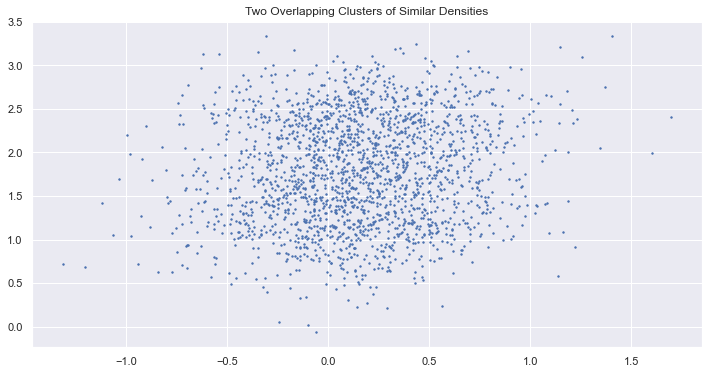

In [17]:
blob_centers = np.array(
    [[ 0.2,  2.3],
     [0.1,  1.3]])


blob_std = np.array([0.4, 0.4])

X2, y2 = make_blobs(n_samples=2000, centers=blob_centers,
                  cluster_std=blob_std, random_state=7)

plt.figure(figsize=(12, 6))
plt.title("Two Overlapping Clusters of Similar Densities")
plt.scatter(X2[:, 0], X2[:, 1], c=None, s=2, cmap='viridis');
plt.show()

## Cluster Using DBSCAN

We train the DBSCAN model using a range of "eps" and "min_samples" values.


Cluster IDs:  [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29 30 31 32 33 34]


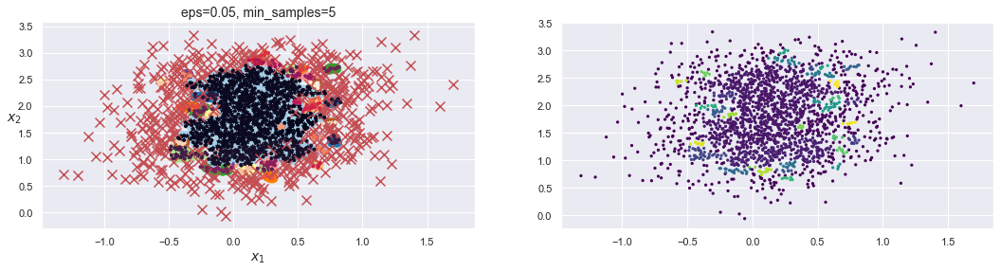

Cluster IDs:  [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38]


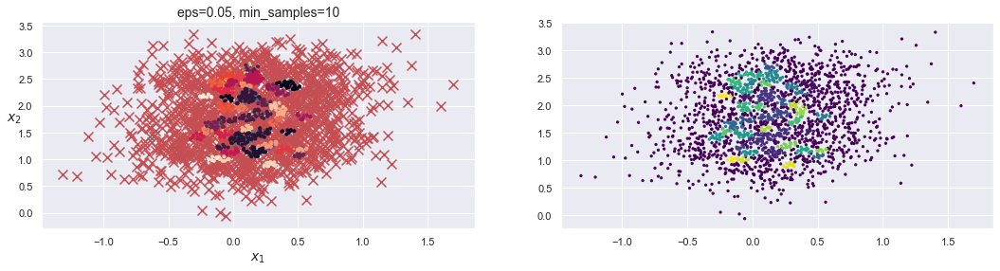

Cluster IDs:  [-1  0]


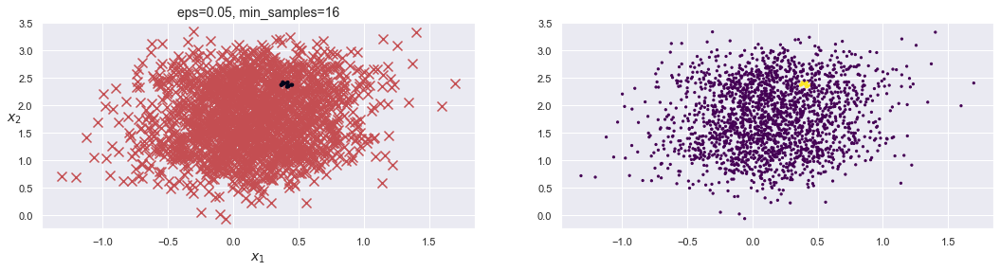

Cluster IDs:  [-1]


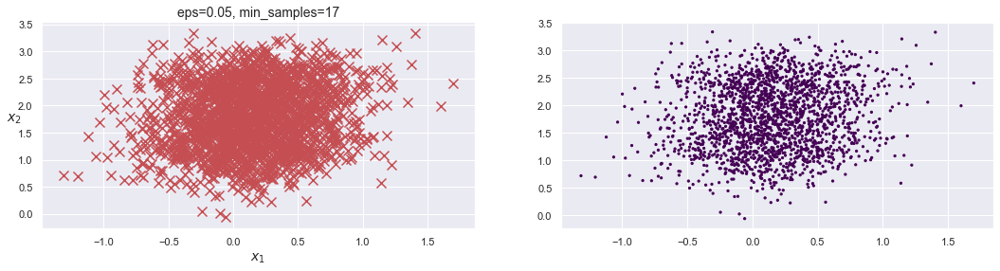

Cluster IDs:  [-1]


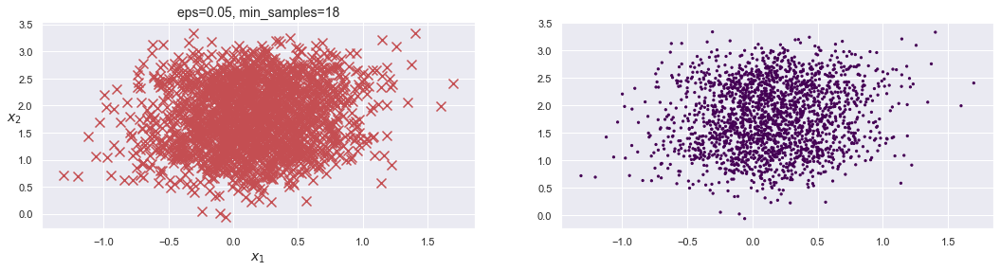

Cluster IDs:  [-1]


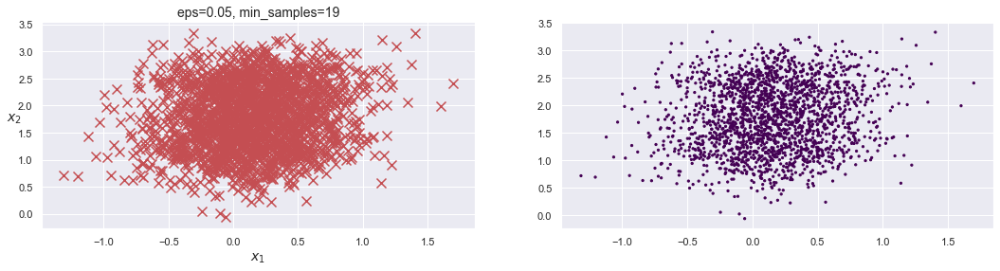

Cluster IDs:  [-1]


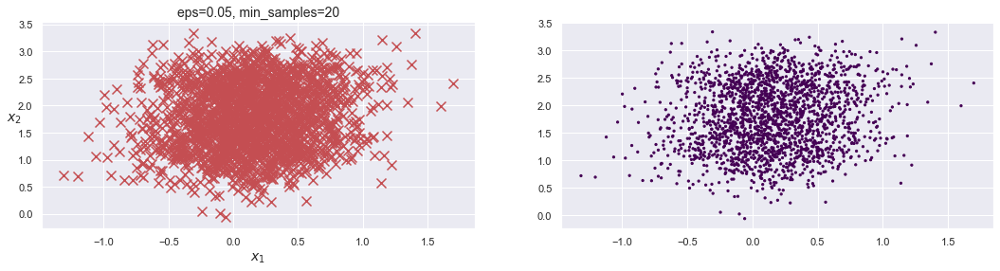

Cluster IDs:  [-1  0  1  2  3  4  5  6  7]


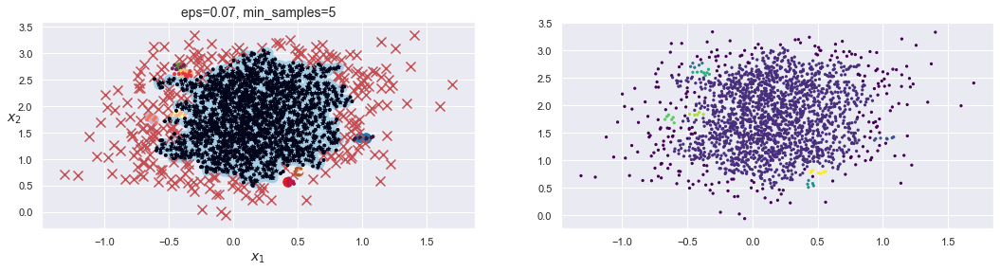

Cluster IDs:  [-1  0  1  2  3  4  5  6]


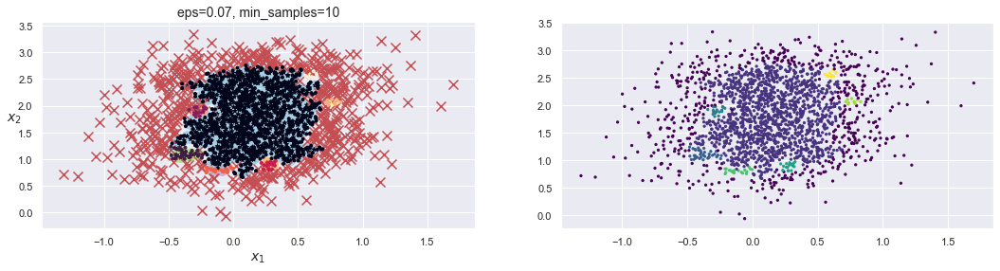

Cluster IDs:  [-1  0  1  2  3  4  5  6  7  8  9]


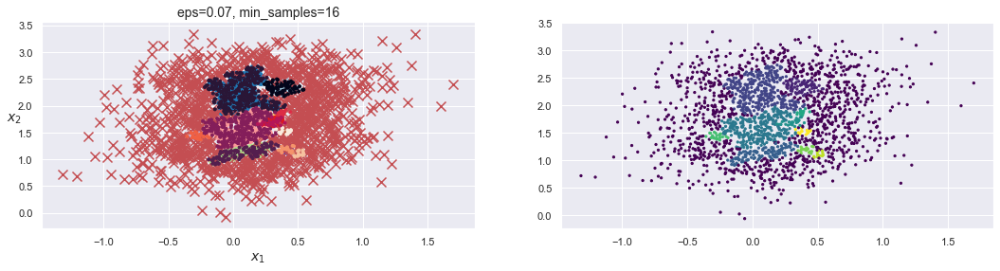

Cluster IDs:  [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13]


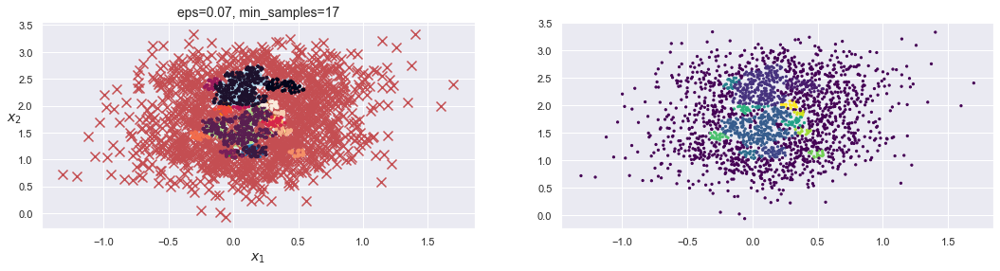

Cluster IDs:  [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13]


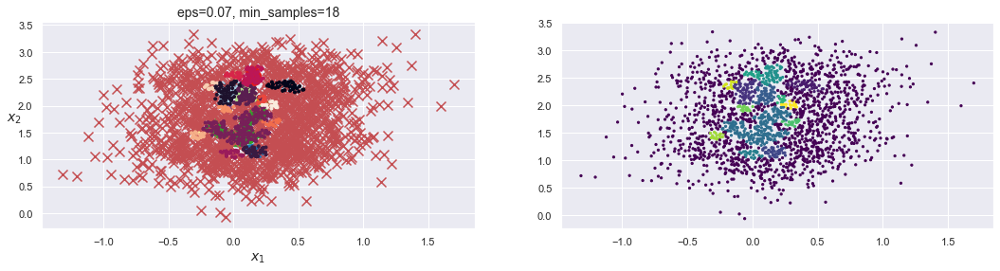

Cluster IDs:  [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13]


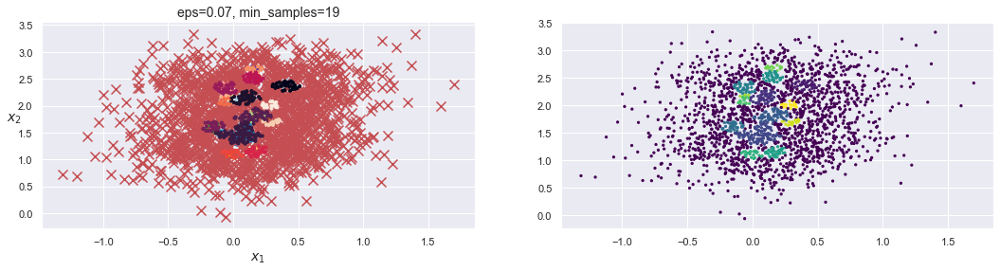

Cluster IDs:  [-1  0  1  2  3  4  5  6  7  8  9 10 11]


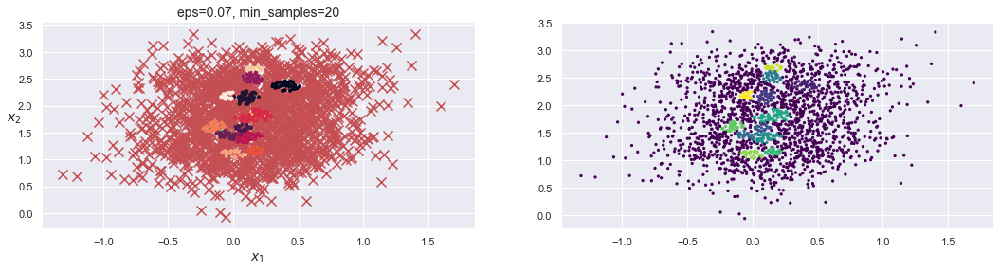

Cluster IDs:  [-1  0  1  2  3  4  5  6  7]


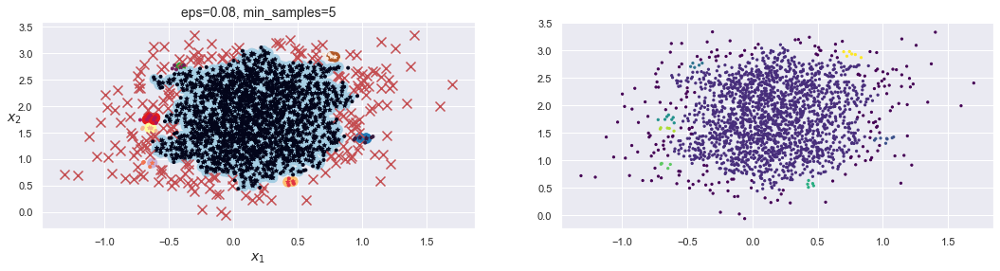

Cluster IDs:  [-1  0  1  2]


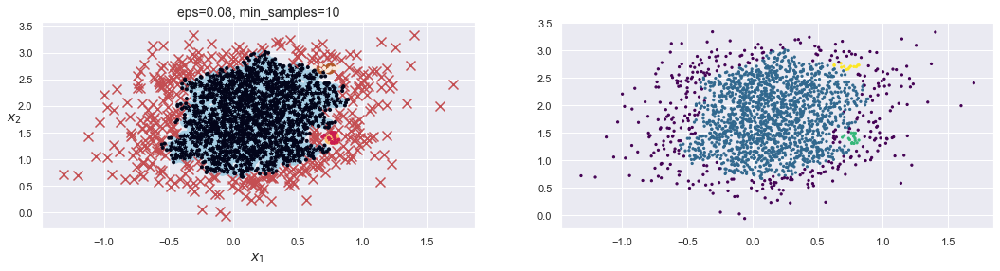

Cluster IDs:  [-1  0  1  2  3  4]


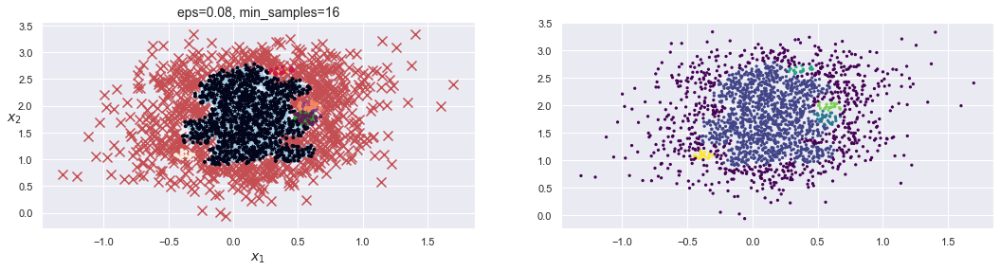

Cluster IDs:  [-1  0  1  2  3]


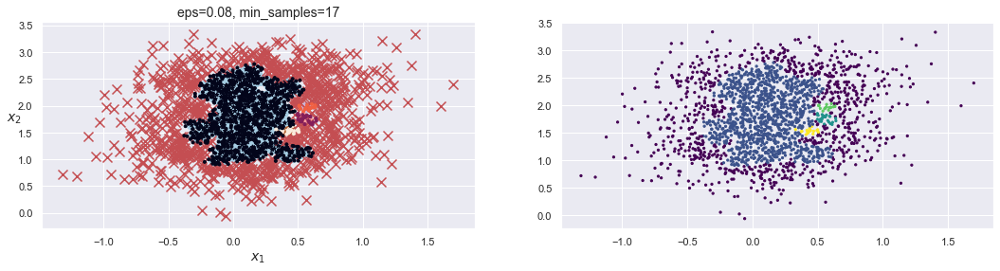

Cluster IDs:  [-1  0  1  2]


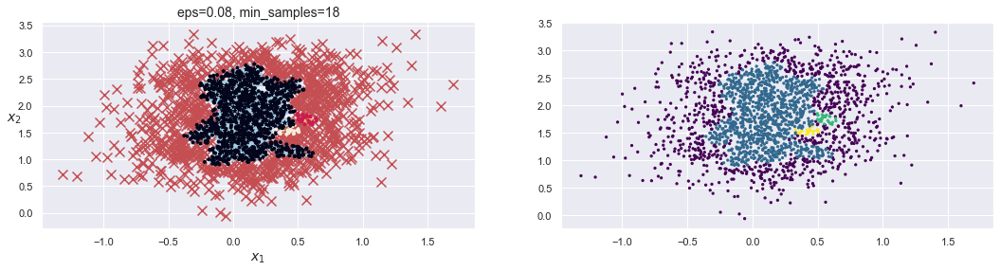

Cluster IDs:  [-1  0  1  2  3  4]


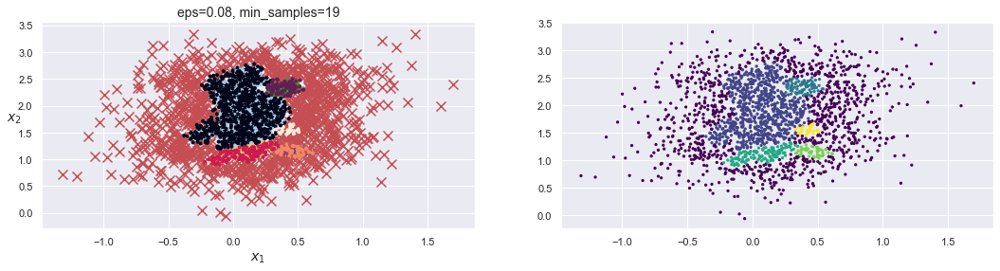

Cluster IDs:  [-1  0  1  2  3  4  5]


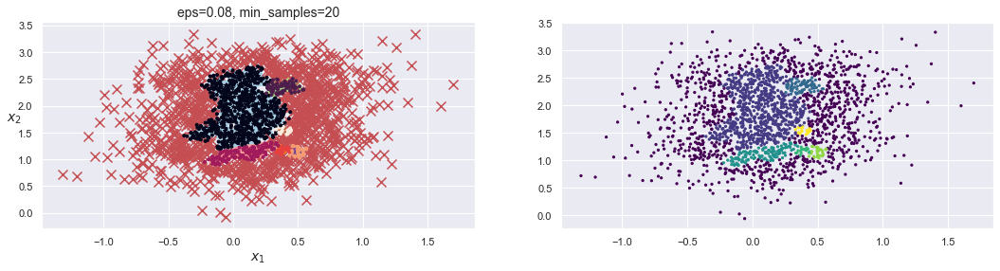

Cluster IDs:  [-1  0  1  2  3  4  5  6]


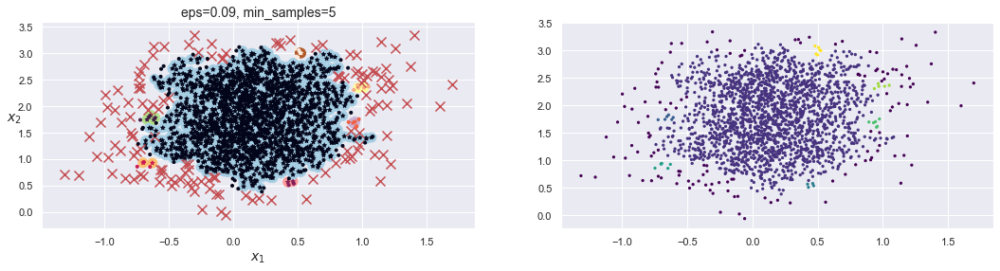

Cluster IDs:  [-1  0  1]


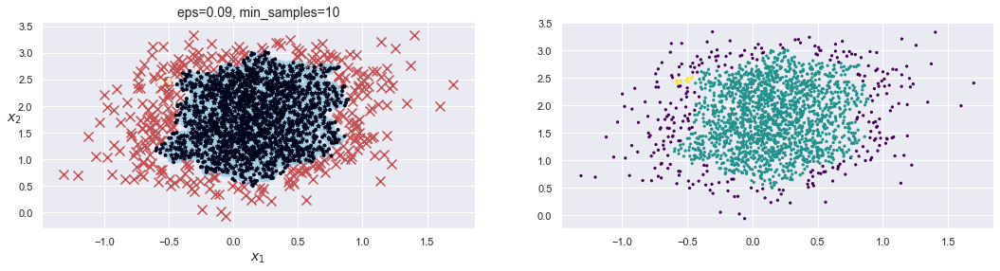

Cluster IDs:  [-1  0  1  2]


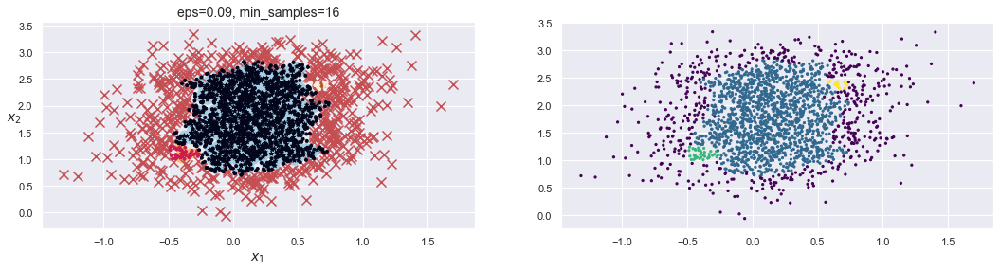

Cluster IDs:  [-1  0  1  2]


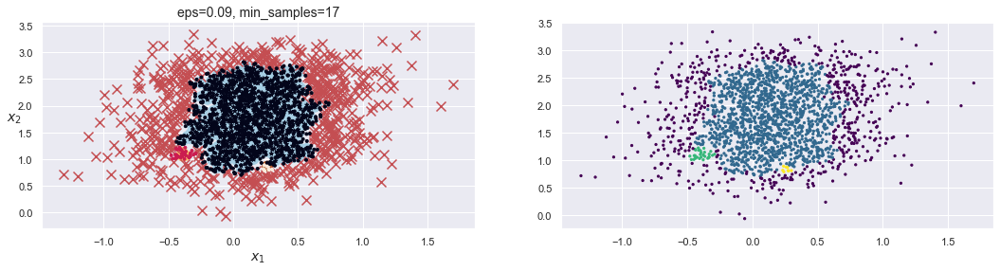

Cluster IDs:  [-1  0  1  2  3  4  5]


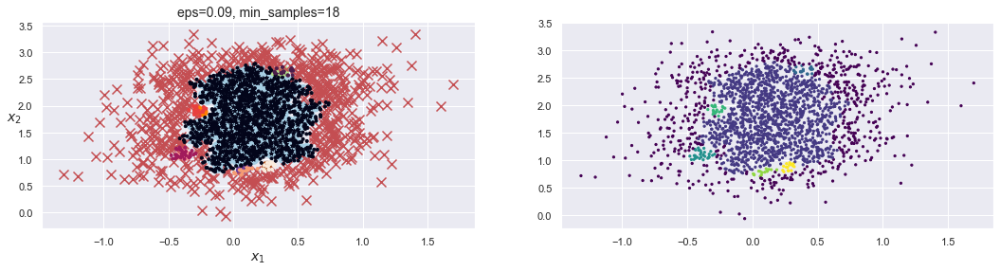

Cluster IDs:  [-1  0  1  2  3]


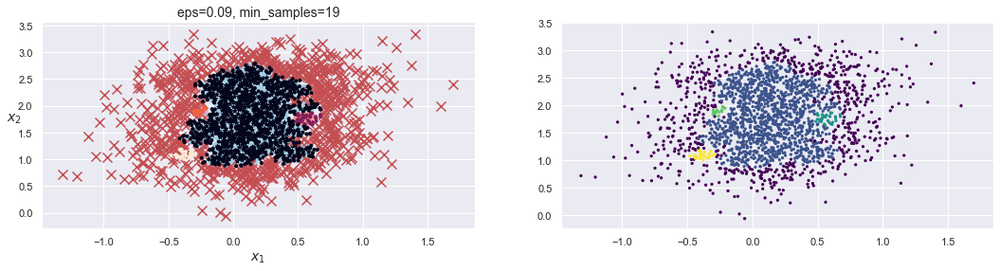

Cluster IDs:  [-1  0  1  2  3]


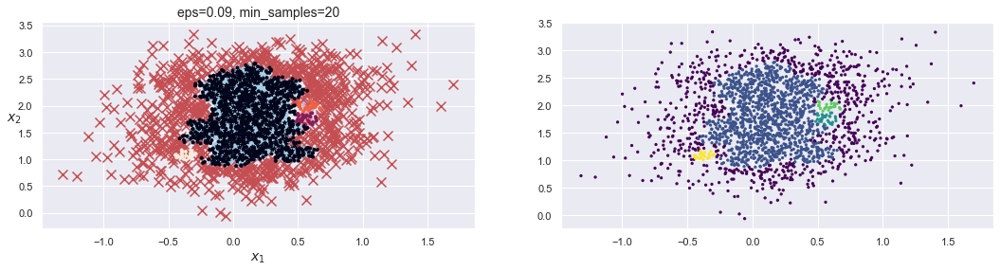

Cluster IDs:  [0]


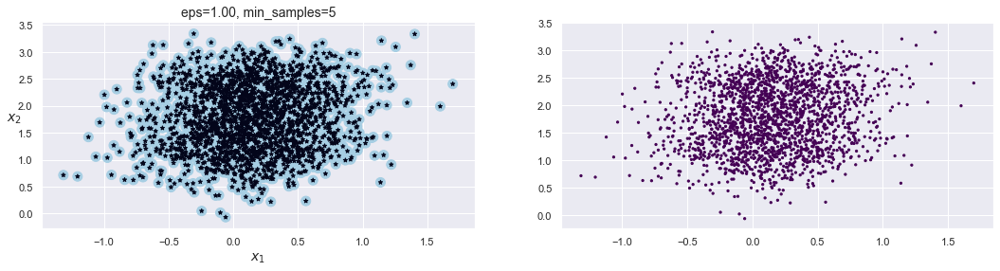

Cluster IDs:  [0]


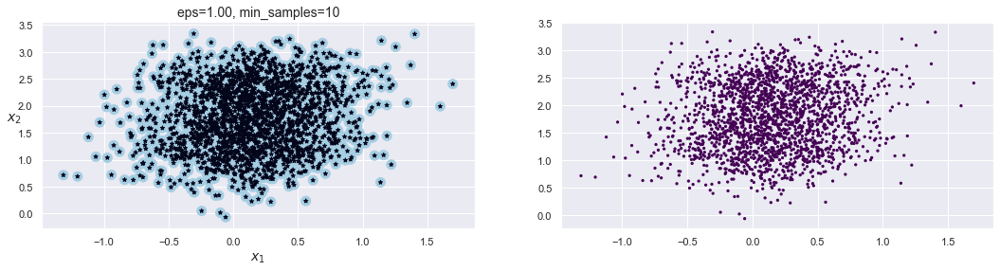

Cluster IDs:  [0]


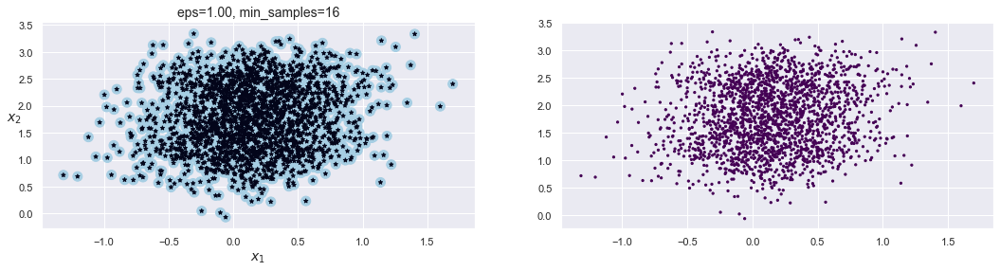

Cluster IDs:  [0]


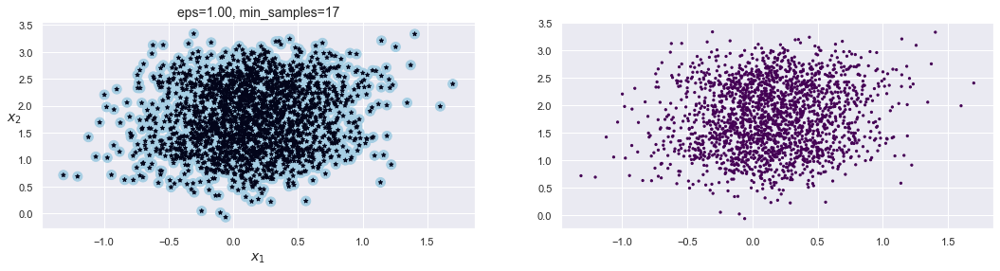

Cluster IDs:  [0]


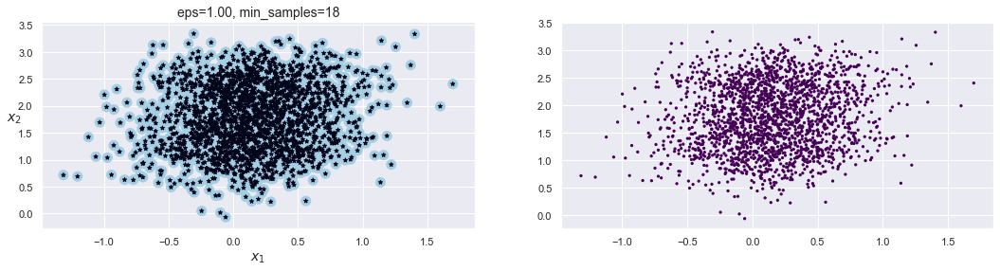

Cluster IDs:  [0]


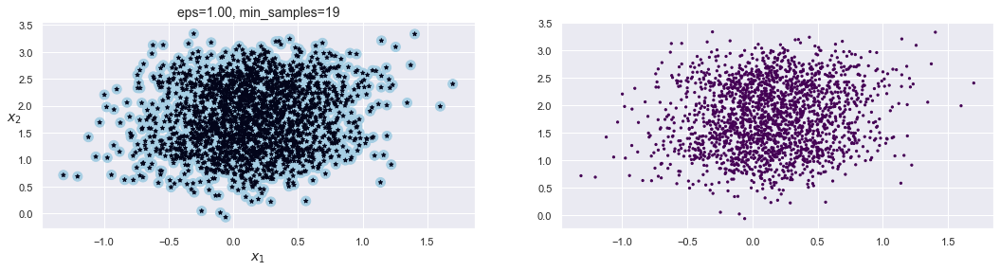

Cluster IDs:  [0]


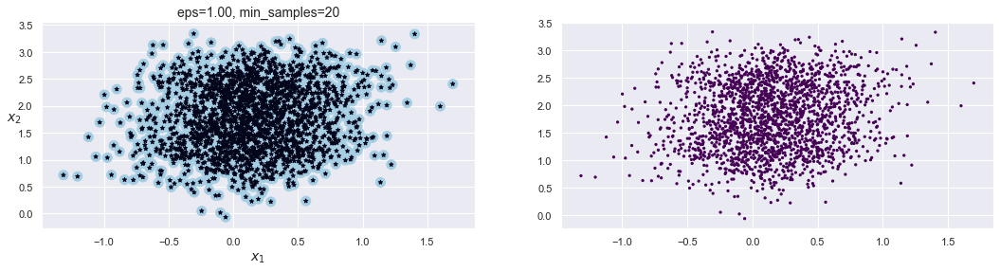

Cluster IDs:  [0]


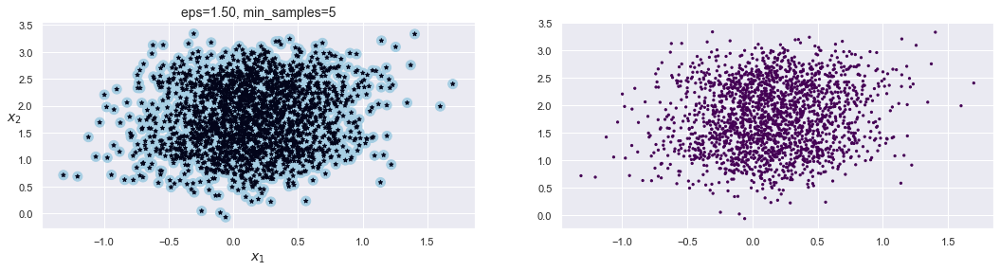

Cluster IDs:  [0]


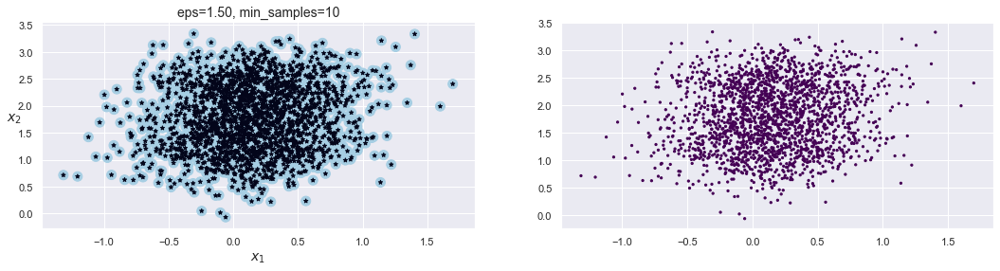

Cluster IDs:  [0]


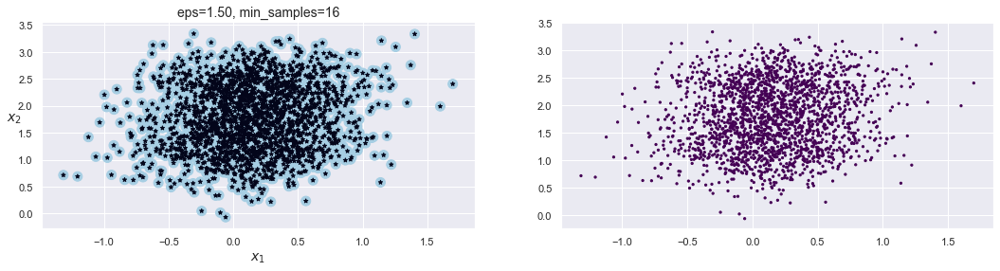

Cluster IDs:  [0]


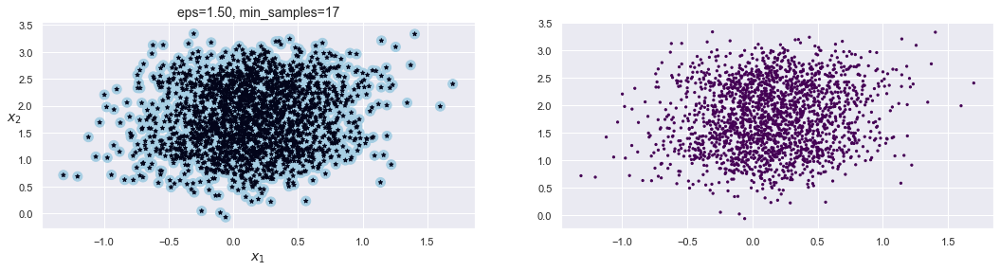

Cluster IDs:  [0]


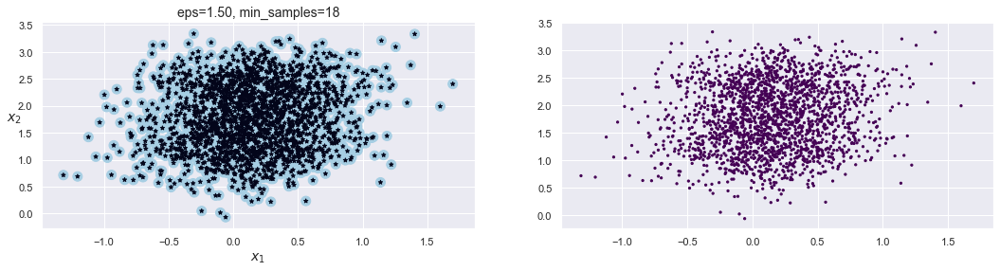

Cluster IDs:  [0]


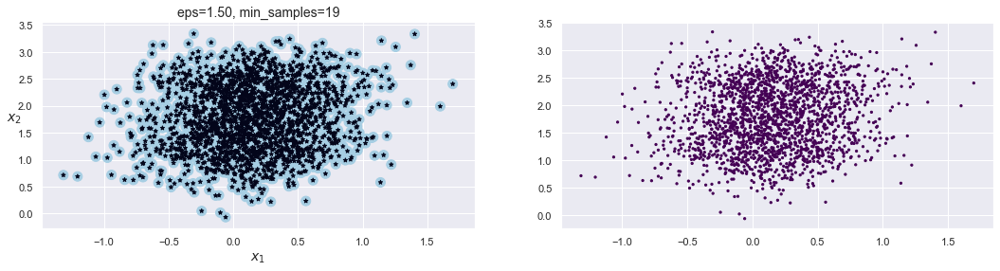

Cluster IDs:  [0]


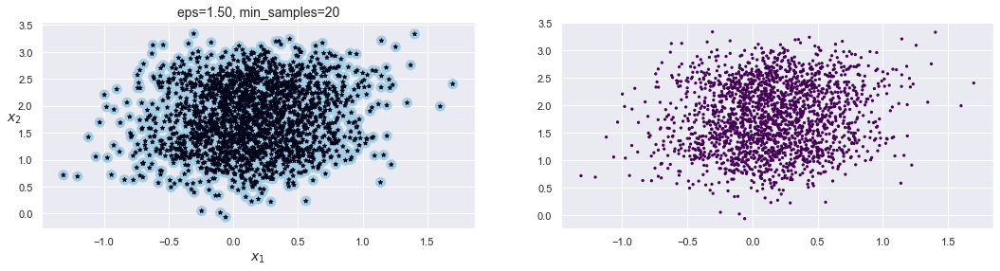

In [8]:
eps_list = [0.05, 0.07, 0.08, 0.09, 1.0, 1.5]
min_sample_list = [5, 10, 16, 17, 18, 19, 20]



for i in range(len(eps_list)):
    for j in range(len(min_sample_list)):
        dbscan2 = DBSCAN(eps=eps_list[i], min_samples=min_sample_list[j])
        dbscan2.fit(X2)

        print("Cluster IDs: ", np.unique(dbscan2.labels_))
        
        plt.figure(figsize=(18, 4))

        plt.subplot(121)
        plot_dbscan(dbscan2, X2, size=100)

        plt.subplot(122)
        plt.scatter(X2[:, 0], X2[:, 1], c=dbscan2.labels_, s=5, cmap='viridis');
        plt.show()


## Task 2: Observation

We see that DBSCAN **fails to discover the two clusters** of similar densities when they overlap.

## Task 2: Compare With GMM and K-Means


We see that (figure below) both GMM and K-Means are able to discover the shape of both the clusters.

Carefully note that, the clusters created by GMM are shown using hard-clustering. The varying densities of the datapoints within the overlapping zone could be better represented via soft clustering.


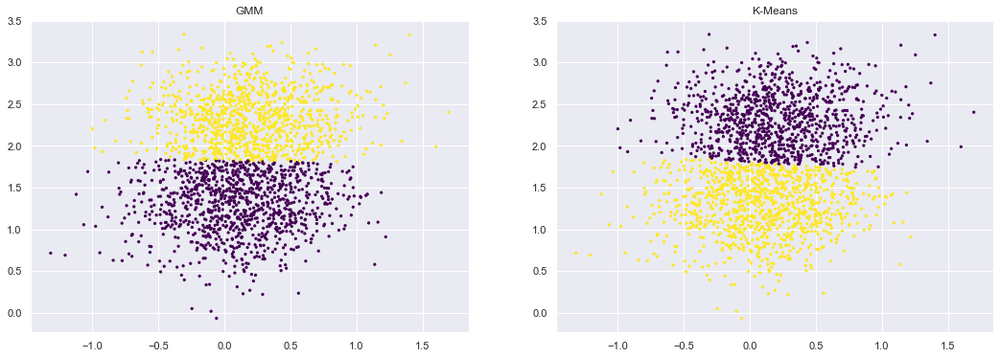

In [19]:
# Train the GMM
gmm2=GaussianMixture(n_components=2, n_init=10, random_state=42)
gmm2.fit(X2)


# Train the K-Means model
kmeans2=KMeans(n_clusters=2, random_state=42, verbose=0)
kmeans2.fit(X2)


plt.figure(figsize=(18, 6))
plt.subplot(121)
plt.title("GMM")
plt.scatter(X2[:, 0], X2[:, 1], c=gmm2.predict(X2), s=5, cmap='viridis');


plt.subplot(122)
plt.title("K-Means")
plt.scatter(X2[:, 0], X2[:, 1], c=kmeans2.fit_predict(X2), s=5, cmap='viridis');